# Wine exploration and clustering

# Data exploration

Libraries import

In [10]:
# General libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# from warnings import filterwarnings # This filter was run after the finished notebook to avoid filtering important warnings
# filterwarnings('ignore')

# Data exploration libraries
from requests import get
from io import StringIO
from ydata_profiling import ProfileReport
from IPython.display import HTML
from statsmodels.tsa.stattools import adfuller
from scipy import stats

# ML libraries
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, silhouette_score

In [11]:
url = 'https://storage.googleapis.com/the_public_bucket/wine-clustering.csv' # Direct link to the dataset
response = get(url)

if response.status_code == 200:
    data = pd.read_csv(StringIO(response.text)) # Dataframe from the csv url
    print('Data retrieved successfully')
else:
    print(f'Failed to download dataset. Status code: {response.status_code}')

data.head(2)
print(f'Dataframe dimensions: {data.shape}')

Data retrieved successfully
Dataframe dimensions: (178, 13)


## Statistical analysis

There are no null, duplicated or infinite values

In [12]:
print(f'Total of null data: {data.isnull().sum().sum()}')
print(f'Total of duplicated data: {data.duplicated().sum()}')

inf_values = np.isinf(data)
inf_rows, inf_cols = np.where(inf_values)

print(f'Rows with inf values: {inf_rows.sum()}')
print(f'Columns with inf values: {inf_cols.sum()}')

Total of null data: 0
Total of duplicated data: 0
Rows with inf values: 0
Columns with inf values: 0


The datatypes are correct

In [14]:
print(f'Data information: \n{data.info()}')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Alcohol               178 non-null    float64
 1   Malic_Acid            178 non-null    float64
 2   Ash                   178 non-null    float64
 3   Ash_Alcanity          178 non-null    float64
 4   Magnesium             178 non-null    int64  
 5   Total_Phenols         178 non-null    float64
 6   Flavanoids            178 non-null    float64
 7   Nonflavanoid_Phenols  178 non-null    float64
 8   Proanthocyanins       178 non-null    float64
 9   Color_Intensity       178 non-null    float64
 10  Hue                   178 non-null    float64
 11  OD280                 178 non-null    float64
 12  Proline               178 non-null    int64  
dtypes: float64(11), int64(2)
memory usage: 18.2 KB
Data information: 
None


By the analysis of distribution made with the kurtosis and skewness tests, and the description about the data, it has been shown that there is not a common scale in the data, mean and standard deviation shows us how different the scale of the columns is. So, there will be needed a scaling before applying a ML model.

In [15]:
print(f'Data description: \n{data.describe()}')

Data description: 
          Alcohol  Malic_Acid         Ash  Ash_Alcanity   Magnesium  \
count  178.000000  178.000000  178.000000    178.000000  178.000000   
mean    13.000618    2.336348    2.366517     19.494944   99.741573   
std      0.811827    1.117146    0.274344      3.339564   14.282484   
min     11.030000    0.740000    1.360000     10.600000   70.000000   
25%     12.362500    1.602500    2.210000     17.200000   88.000000   
50%     13.050000    1.865000    2.360000     19.500000   98.000000   
75%     13.677500    3.082500    2.557500     21.500000  107.000000   
max     14.830000    5.800000    3.230000     30.000000  162.000000   

       Total_Phenols  Flavanoids  Nonflavanoid_Phenols  Proanthocyanins  \
count     178.000000  178.000000            178.000000       178.000000   
mean        2.295112    2.029270              0.361854         1.590899   
std         0.625851    0.998859              0.124453         0.572359   
min         0.980000    0.340000         

In [16]:
# Full distribution analysis
mean, std, skewness, kurtosis = [], [], [], []

for column in data.columns:
    mean.append(data[column].mean())
    std.append(data[column].std())
    skewness.append(stats.skew(data[column]))
    kurtosis.append(stats.kurtosis(data[column]))

stats_data = pd.DataFrame({'Column': data.columns, 
                         'Mean': mean,
                         'Std': std,
                         'Skewness': skewness, 
                         'Kurtosis': kurtosis})
stats_data

,Column,Mean,Std,Skewness,Kurtosis
0,Alcohol,13.000618,0.811827,-0.051047,-0.862260
1,Malic_Acid,2.336348,1.117146,1.030869,0.257348
2,Ash,2.366517,0.274344,-0.175207,1.078576
3,Ash_Alcanity,19.494944,3.339564,0.211247,0.440823
4,Magnesium,99.741573,14.282484,1.088915,2.012806
5,Total_Phenols,2.295112,0.625851,0.085907,-0.845857
6,Flavanoids,2.029270,0.998859,0.025129,-0.889365
7,Nonflavanoid_Phenols,0.361854,0.124453,0.446349,-0.652952
8,Proanthocyanins,1.590899,0.572359,0.512769,0.505671
9,Color_Intensity,5.058090,2.318286,0.861248,0.337370


Thanks to the Kurtosis test, we can observe that columns such as `Magnesium`, `Ash`, and `OD280` have more outliers than expected. This is evident from the values greater than 1 (in absolute value), indicating the need for outlier treatment.

It's important to note that the K-Nearest Neighbors (KNN) clustering model is based on distances. Therefore, large distances that deviate significantly from the mean (outliers) can make a problem in the model evaluation. This can lead to poor performance in the metrics.

The outlier treatment will be done based on the Interquartile Range (IQR) method. This is the mathematical expression to note:
$$\text{{Outliers}} = \{x: x < Q1 - 1.5 \times IQR \text{{ or }} x > Q3 + 1.5 \times IQR\}$$

In [24]:
# Interquartile Range (IQR) method to remove outliers
Q1, Q3 = data.quantile(0.25), data.quantile(0.75) # First and third quartiles
IQR = Q3 - Q1
data_transformed = data[~((data < (Q1 - 1.5 * IQR)) | (data > (Q3 + 1.5 * IQR))).any(axis=1)] # Remove outliers applying IQR method

# Number of rows deleted
rows_deleted = len(data) - len(data_transformed)
print(f'Number of rows deleted: {rows_deleted}')
print(f'Percentage of rows deleted: {rows_deleted / len(data) * 100:.1f}%')

Number of rows deleted: 17
Percentage of rows deleted: 9.6%


Most of the values for each column analyzing distribution in the data have declined after the outlier treatment with IQR method. This indicates that the variance in our data has been reduced a little. But I cannot assure this 100%, so there will be an analysis of the correlation between variables, distribution in histograms and more to asure my hypothesis.

In [27]:
# Full distribution analysis with and without outliers
mean, std, skewness, kurtosis = [], [], [], []
mean_no_outliers, std_no_outliers, skewness_no_outliers, kurtosis_no_outliers = [], [], [], []

for column in data.columns:
    # Distribution analysis with outliers
    mean.append(data[column].mean())
    std.append(data[column].std())
    skewness.append(stats.skew(data[column]))
    kurtosis.append(stats.kurtosis(data[column]))

    # Distribution analysis without outliers
    mean_no_outliers.append(data_transformed[column].mean())
    std_no_outliers.append(data_transformed[column].std())
    skewness_no_outliers.append(stats.skew(data_transformed[column]))
    kurtosis_no_outliers.append(stats.kurtosis(data_transformed[column]))

stats_data = pd.DataFrame({
    'Column': data.columns, 
    'Mean': mean,
    'Mean no outliers': mean_no_outliers,
    'Std': std,
    'Std no outliers': std_no_outliers,
    'Skewness': skewness,
    'Skewness no outliers': skewness_no_outliers,
    'Kurtosis': kurtosis,
    'Kurtosis no outliers': kurtosis_no_outliers
})

stats_data

,Column,Mean,Mean no outliers,Std,Std no outliers,Skewness,Skewness no outliers,Kurtosis,Kurtosis no outliers
0,Alcohol,13.000618,13.040373,0.811827,0.797841,-0.051047,-0.031549,-0.862260,-0.962774
1,Malic_Acid,2.336348,2.306832,1.117146,1.048263,1.030869,0.885637,0.257348,-0.251844
2,Ash,2.366517,2.363292,0.274344,0.241205,-0.175207,-0.213647,1.078576,0.008941
3,Ash_Alcanity,19.494944,19.232298,3.339564,3.014706,0.211247,0.032273,0.440823,0.021409
4,Magnesium,99.741573,98.534161,14.282484,12.365290,1.088915,0.493753,2.012806,-0.164129
5,Total_Phenols,2.295112,2.290373,0.625851,0.632366,0.085907,0.081417,-0.845857,-0.835871
6,Flavanoids,2.029270,2.043789,0.998859,0.985649,0.025129,-0.130539,-0.889365,-1.218549
7,Nonflavanoid_Phenols,0.361854,0.358137,0.124453,0.121810,0.446349,0.513787,-0.652952,-0.507835
8,Proanthocyanins,1.590899,1.548075,0.572359,0.525859,0.512769,0.326566,0.505671,0.026747
9,Color_Intensity,5.058090,5.014161,2.318286,2.117379,0.861248,0.617652,0.337370,-0.292383


Visualization of the outliers elimination, and rescaling of the columns after this elimination
Take into account that there are more red dots in all the boxplots than 17 because some rows of outliers had outliers in more than one column, but in total, there were eliminated 17 rows of data

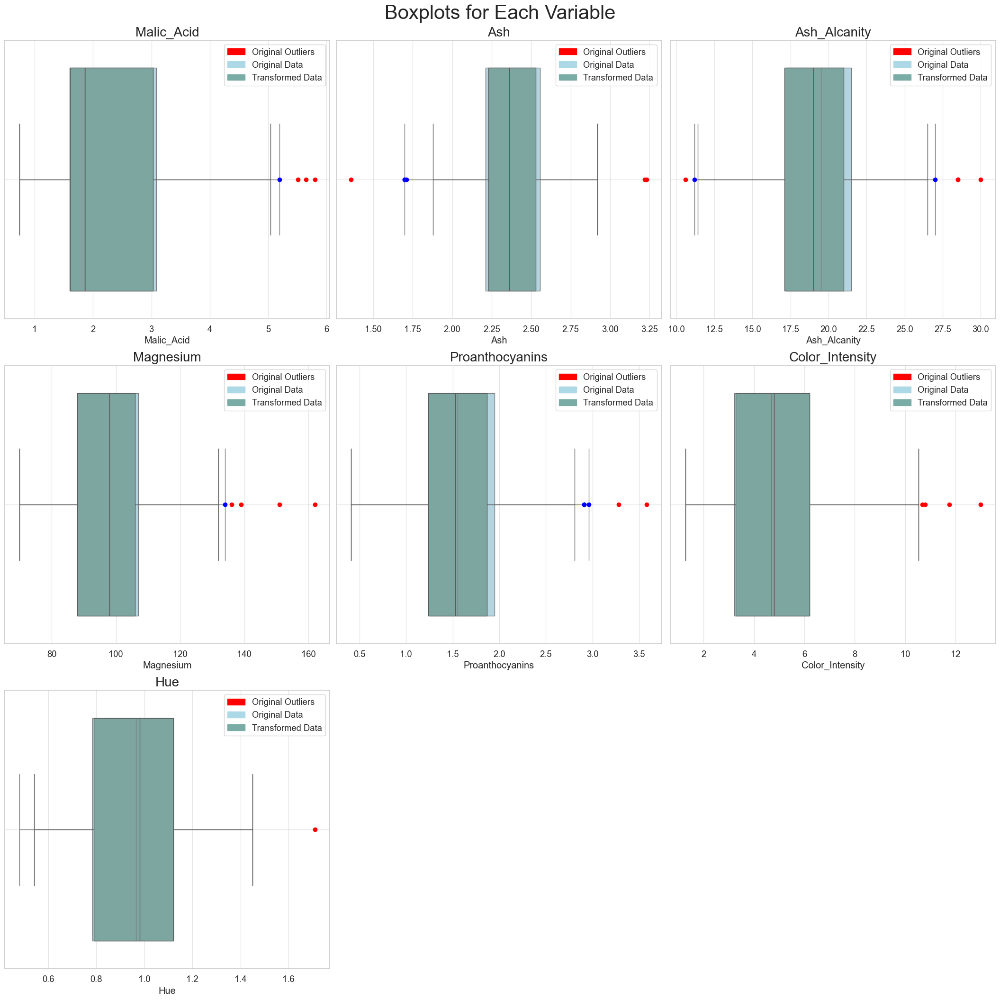

In [60]:
import matplotlib.patches as mpatches
sns.set_style('whitegrid')
sns.set_context("notebook", font_scale=1.2)

# Columns affected where selected by hand to not show every 13 boxplots
columns_affected = ['Malic_Acid', 'Ash', 'Ash_Alcanity', 'Magnesium', 'Proanthocyanins', 'Color_Intensity', 'Hue']

num_plots = len(data[columns_affected].columns)
total_cols = 3
total_rows = num_plots // total_cols + 1
fig, axs = plt.subplots(nrows=total_rows, ncols=total_cols,
                        figsize=(7*total_cols, 7*total_rows), constrained_layout=True)

flierprops_orig = dict(marker='o', markerfacecolor='red', markersize=6,
                       linestyle='none', markeredgecolor='red')
flierprops_transformed = dict(marker='o', markerfacecolor='blue', markersize=6,
                              linestyle='none', markeredgecolor='blue')

for i, var in enumerate(data[columns_affected].columns):
    row = i // total_cols
    pos = i % total_cols
    plot = sns.boxplot(x=var, data=data[columns_affected], ax=axs[row][pos], flierprops=flierprops_orig, color='lightblue')
    plot = sns.boxplot(x=var, data=data_transformed[columns_affected], ax=axs[row][pos], flierprops=flierprops_transformed, color='#78ACA5')
    plot.set_title(f'{var}', fontdict={'fontsize': 20})
    plot.grid(alpha=0.5)

    # Add legend
    red_patch = mpatches.Patch(color='red', label='Original Outliers')
    lightblue_patch = mpatches.Patch(color='lightblue', label='Original Data')
    otherblue_patch = mpatches.Patch(color='#78ACA5', label='Transformed Data')
    plot.legend(handles=[red_patch, lightblue_patch, otherblue_patch], loc='upper right')

# Remove empty subplots
if num_plots % total_cols:
    for ax in axs.flatten()[num_plots:]:
        ax.remove()

plt.suptitle('Boxplots for each variable affected by the outlier treatment', fontsize=30)
plt.show()

## Statistical distribution analysis with ProfileReport from ydata_profiling

In [55]:
profile_report = ProfileReport(data_transformed, title='Wine clustering profiling report', 
                               explorative=True, correlations={"spearman": {"calculate": True}})
profile_report.to_file('../reports/wine_clustering_profiling_report.html')
profile_report

d:\Estiven\Datos\virtual-envs\wine_exploration_and_clustering\Lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

<Figure size 1000x1000 with 0 Axes>

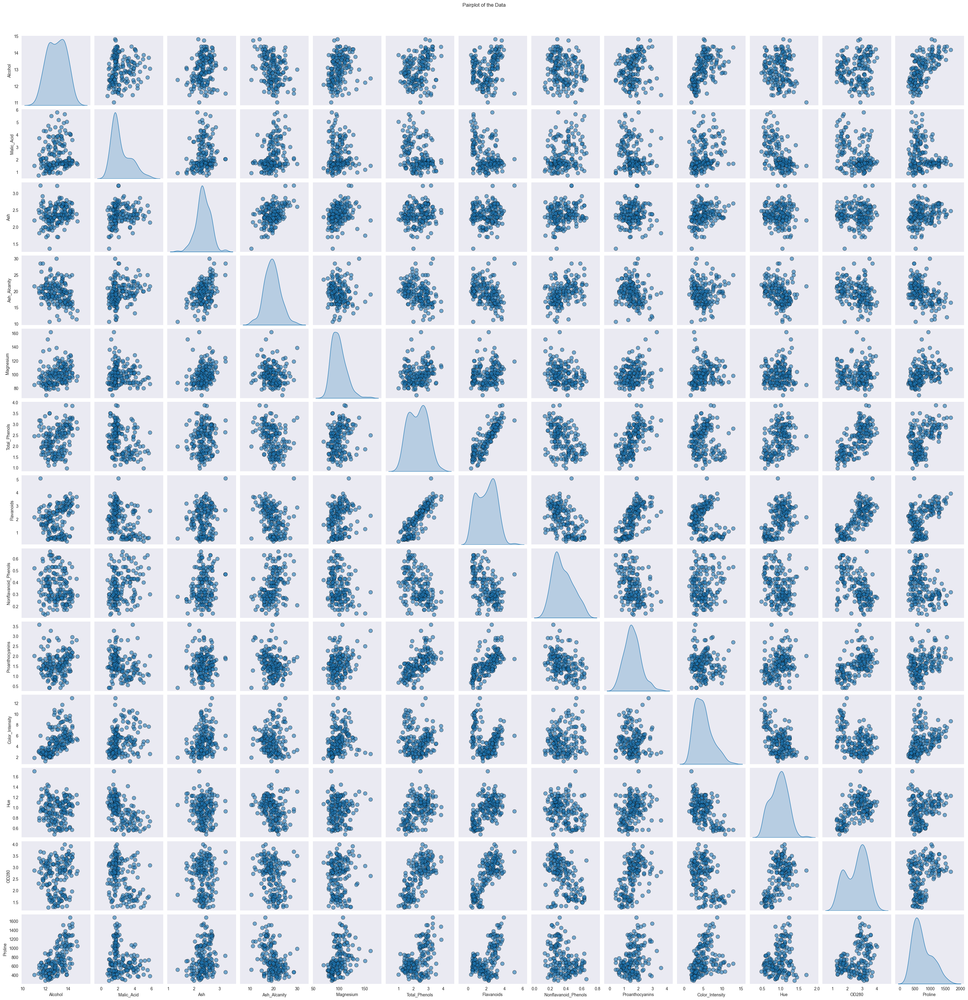

In [38]:
plt.figure(figsize=(10,10))
pairplot = sns.pairplot(data, diag_kind='kde', plot_kws={'alpha': 0.6, 's': 80, 'edgecolor': 'k'})
pairplot.fig.suptitle("Pairplot of the Data", y=1.02)
plt.show()